<a href="https://colab.research.google.com/github/LSDtopotools/lsdtt_notebooks/blob/master/lsdtopotools/channel_steepness_and_concavity_examples/getting_slope_area_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Getting slope-area data

*Last updated by Simon M. Mudd on 21/09/2023*

This notebook extracts slope-area data and compares this to some chi profiles.

## Stuff we need to do if you are in colab (not required in the lsdtopotools pytools container)

**If you are in the `docker_lsdtt_pytools` docker container, you do not need to do any of this.
The following is for executing this code in the google colab environment only.**

If you are in the docker container you can skip to the **Download some data** section.

First we install `lsdviztools`. This will take around a minute. It is important you do this before the `condacolab` step.

In [1]:
!pip install lsdviztools &> /dev/null

Now we need to install lsdtopotools. We do this using something called `mamba`. To get `mamba` we install something called `condacolab`.

In [2]:
!pip install -q condacolab
import condacolab
condacolab.install()

⏬ Downloading https://github.com/conda-forge/miniforge/releases/download/23.1.0-1/Mambaforge-23.1.0-1-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:17
🔁 Restarting kernel...


In [1]:
!mamba install -y lsdtopotools &> /dev/null

The next line tests to see if it worked. If you get some output asking for a parameter file then `lsdtopotools` is installed. This notebook was tested on version 0.8.

In [ ]:
!lsdtt-basic-metrics -v

## Download some data

We need to get some data to download.

For this example we will work nean Xi'an, China (西安) that we studied in this paper:

* Wang, Y.Z., Mudd, S.M., 2021. Evidence for and against landscape transience in the Northern Qinling Mountains, China. Geomorphology 391, 107890. https://doi.org/10.1016/j.geomorph.2021.107890

We are going to download data using the opentopography scraper that is included with `lsdviztools`. You will need to get an opentopography.org account and copy in your API key.

You can sign up to an opentopography.org account here: https://portal.opentopography.org/myopentopo

In [3]:
from typing import Collection
import lsdviztools.lsdbasemaptools as bmt
from lsdviztools.lsdplottingtools import lsdmap_gdalio as gio

# YOU NEED TO PUT YOUR API KEY IN A FILE
your_OT_api_key_file = "my_OT_api_key.txt"

with open(your_OT_api_key_file, 'r') as file:
    print("I am reading you OT API key from the file "+your_OT_api_key_file)
    api_key = file.read().rstrip()
    print("Your api key starts with: "+api_key[0:4])

Dataset_prefix = "Col"
source_name = "COP30"

Col_DEM = bmt.ot_scraper(source = source_name,
                        lower_left_coordinates = [10.243487342835357, -74.29697050375012],
                        upper_right_coordinates = [11.462794787927226, -72.95731536139486],
                        prefix = Dataset_prefix,
                        api_key_file = your_OT_api_key_file)
Col_DEM.print_parameters()
Col_DEM.download_pythonic()
DataDirectory = "./"
Fname = Dataset_prefix+"_"+source_name+".tif"
gio.convert4lsdtt(DataDirectory,Fname)

I am reading you OT API key from the file my_OT_api_key.txt
Your api key starts with: 9515
I am taking your coordinates from the lower left list
I am taking your coordinates from the upper right list
I am reading you OT API key from the file my_OT_api_key.txt
The source is: COP30
The west longitude is: -74.29697050375012
The east longitude is: -72.95731536139486
The south latitude is: 11.462794787927226
The north latitude is: 10.243487342835357
The path is: ./
The prefix is: Col
The resolution is: 30
I am going to download the following for you:
https://portal.opentopography.org/API/globaldem?demtype=COP30&south=10.243487342835357&north=11.462794787927226&west=-74.29697050375012&east=-72.95731536139486&outputFormat=GTiff&API_Key=951579bc84bc38a5894d4d43750aac09
This might take a little while, depending on the size of the file. 
The filename will be:
./Col_COP30.tif
The path and file without path are:
./  Col_COP30.tif
Finished downloading
The projections is:
GEOGCS["WGS 84",DATUM["WGS_

'Col_COP30_UTM.bil'

## Get some basins

One way to get all the basins we want it to make a file with the latitude and longitude of the outlets. We can go into google maps and right click on locations, and then copy these into a latitude and longitude list.

In [4]:
# Import pandas library
import pandas as pd

data = [ [11.215875183853823, -73.7112482063984],
         [11.20819754513819, -73.58223415528764],
         [11.185269284270126, -73.46166298330202],
         [10.670088285447317, -73.2250408057607],
         [10.512239894026917, -73.2937577268195],
         [10.441300178937384, -74.00302493171245],
         [10.55334408279103, -74.03983317983842],
         [10.653313240023875, -74.0799027659381],
         [10.904840554781519, -74.14116537559536],
         ]

# Create the pandas DataFrame
df = pd.DataFrame(data, columns = ['latitude', 'longitude'])

df.to_csv("basin_outlets.csv",index=False)
df.head()

,latitude,longitude
0,11.215875,-73.711248
1,11.216325,-73.687074
2,11.185269,-73.461663
3,10.670088,-73.225041
4,10.512240,-73.293758


## Now get basins, hillshade, channel profiles, and slope-area data all in one go.

I am going to get a bunch of data all in one step, so I have switched on a bunch of analyses all at once.

In [6]:
import lsdviztools.lsdmapwrappers as lsdmw
lsdtt_parameters = {"print_basin_raster" : "true",
                    "print_basin_raster" : "true",
                    "get_basins_from_outlets" : "true",
                    "basin_outlet_csv" : "basin_outlets.csv",
                    "write_hillshade" : "true",
                    "print_chi_data_maps" : "true",
                    "print_slope_area_data" : "true",
                    "segment_slope_area_data" : "true"
                    }
r_prefix = Dataset_prefix+"_"+source_name +"_UTM"
w_prefix = Dataset_prefix+"_"+source_name +"_UTM"
lsdtt_drive = lsdmw.lsdtt_driver(command_line_tool = "lsdtt-chi-mapping",
                                 read_prefix = r_prefix,
                                 write_prefix= w_prefix,
                                 read_path = "./",
                                 write_path = "./",
                                 parameter_dictionary=lsdtt_parameters)
lsdtt_drive.print_parameters()
lsdtt_drive.run_lsdtt_command_line_tool()

The lsdtopotools command line tools available are: 
['lsdtt-basic-metrics', 'lsdtt-channel-extraction', 'lsdtt-chi-mapping', 'lsdtt-cosmo-tool', 'lsdtt-hillslope-channel-coupling', 'lsdtt-valley-metrics']
Testing has been done against lsdtopotools v0.7
The command line tool is: lsdtt-chi-mapping
The driver name is: Test_01
The read path is: ./
The write path is: ./
The read prefix is: Col_COP30_UTM
The write prefix is: Col_COP30_UTM
The parameter dictionary is:
{'print_basin_raster': 'true', 'get_basins_from_outlets': 'true', 'basin_outlet_csv': 'basin_outlets.csv', 'write_hillshade': 'true', 'print_chi_data_maps': 'true', 'print_slope_area_data': 'true', 'segment_slope_area_data': 'true'}
Done writing the driver file
I've finised writing the driver file. Let me run LSDTT for you.


## Look at all the data

## First just the hillshade

In [7]:
%%capture
DataDirectory = "./"
# Use the capture comment to get rid of all the text
# But it will also not display an inline image
# So you need to call the image from the next line of code
# WARNING %%capture must be the first line in a code block (you can't even have comments above)
Base_file = r_prefix
this_img = lsdmw.SimpleHillshade(DataDirectory,Base_file,cmap="gist_earth",
                                 save_fig=True, size_format="geomorphology",dpi=600)

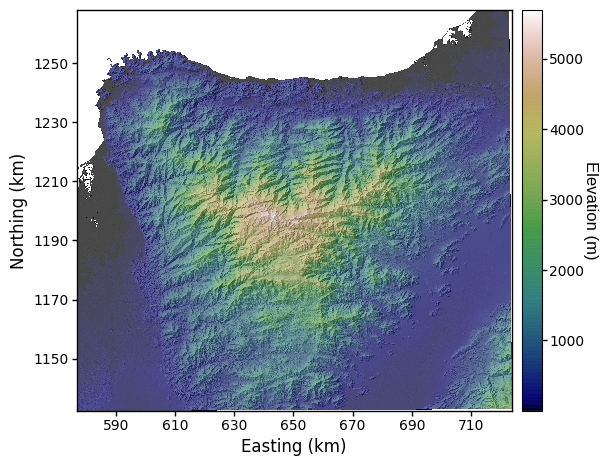

In [8]:
print(this_img)
from IPython.display import display, Image
display(Image(filename=this_img, width=800))

## Now the basins

In [9]:
%%capture
Base_file = r_prefix
basins_img = lsdmw.PrintBasins_Complex(DataDirectory,Base_file,cmap="gist_earth",
                             size_format="geomorphology",dpi=600, save_fig = True)

print(basins_img)
from IPython.display import display, Image
display(Image(filename=basins_img, width=800))

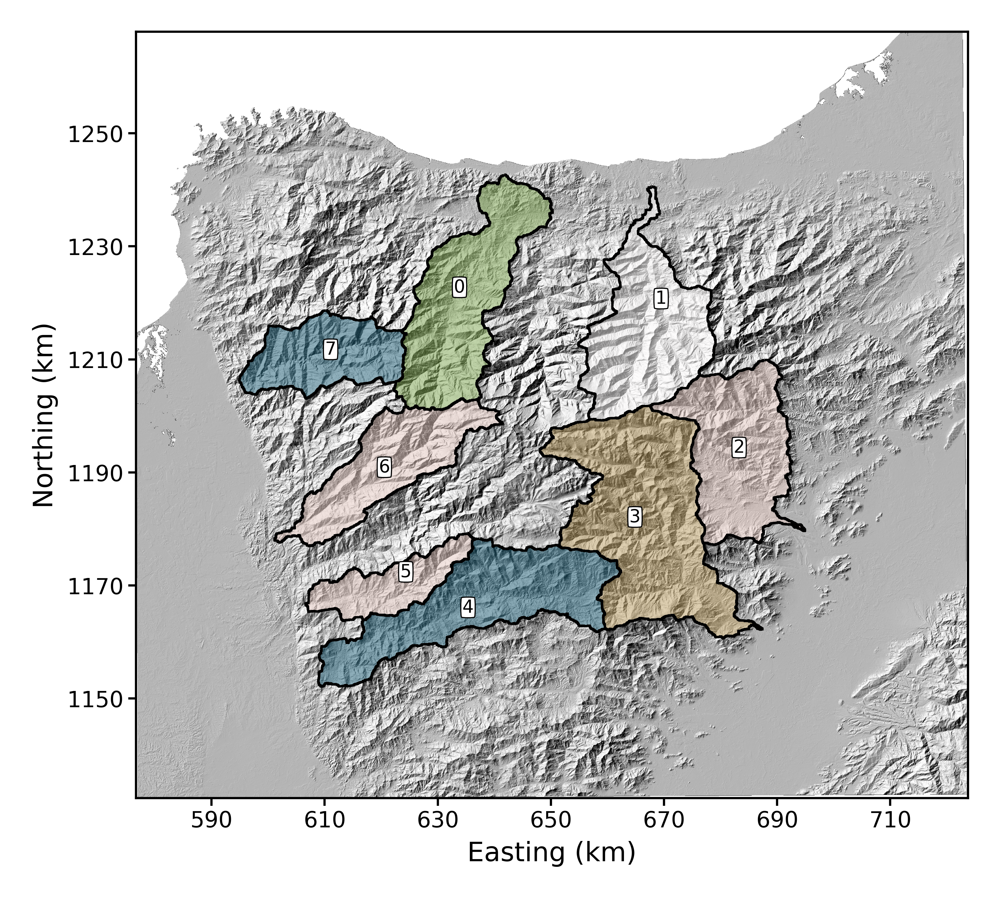

In [10]:
from IPython.display import display, Image
display(Image(filename=basins_img, width=800))

## Now lets look at slope area data and channel profiles.

Lets plot some slope-area analyses:

In [14]:
from lsdviztools.lsdplottingtools import lsdmap_saplotting as SA

This plots the slope-area for all the tributaries in a given basin

In [ ]:
SA.BinnedWithRawSlopeAreaPlot("./","Col_COP30_UTM",basin_key = 0,FigFormat="png", FigFileName="SA_b0.png")

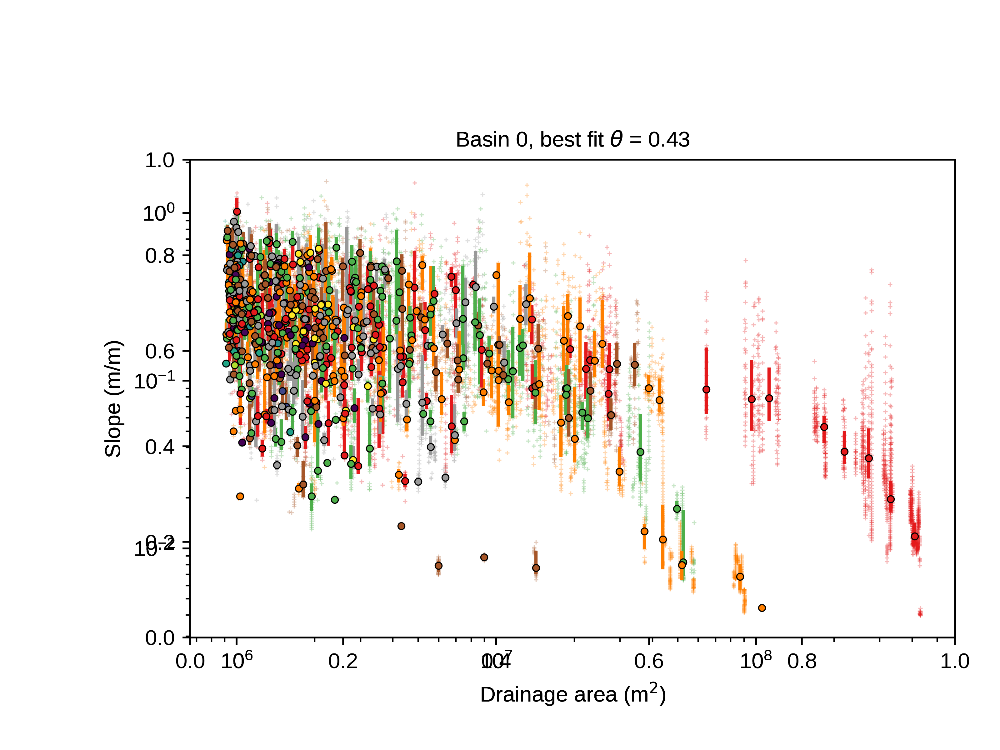

In [19]:
from IPython.display import display, Image
display(Image(filename="./SA_plots/SA_b0.png", width=800))

This plots S-A data for just the main channel in every basin, and dumps the images in the directory `SA_plots`

In [20]:
SA.SAPlotDriver("./","Col_COP30_UTM", FigFormat = "png")

These basin keys are: 
[]
I'm reading in the csv file ./Col_COP30_UTM_SAbinned.csv
The object file prefix is: Col_COP30_UTM_SAbinned
Loading your file from csv
Something has gone wrong, latitude is not in the variable list
Here is the variable list: 
['basin_key', 'source_key', 'midpoints_log_A', 'mean_log_A', 'median_log_A', 'logA_stdErr', 'logA_MAD', 'mean_log_S', 'median_log_S', 'logS_FirstQuartile', 'logS_ThirdQuartile', 'logS_stdDev', 'n_observations']
Something has gone wrong, longitude is not in the variable list
Here is the variable list: 
['basin_key', 'source_key', 'midpoints_log_A', 'mean_log_A', 'median_log_A', 'logA_stdErr', 'logA_MAD', 'mean_log_S', 'median_log_S', 'logS_FirstQuartile', 'logS_ThirdQuartile', 'logS_stdDev', 'n_observations']
done
I am going to show the raw data.
The object file prefix is: Col_COP30_UTM_SAvertical
Loading your file from csv
done
I am going to show segments on the main stem.
The object file prefix is: Col_COP30_UTM_SAsegmented
Loading your f

/usr/local/lib/python3.10/dist-packages/lsdviztools/lsdplottingtools/lsdmap_saplotting.py:678: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(RawArea,RawSlope,c="k",s=4,marker="+",lw=0.5,edgecolors='k',zorder=-10,alpha = 0.3)
/usr/local/lib/python3.10/dist-packages/lsdviztools/lsdplottingtools/lsdmap_saplotting.py:746: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(SegmentMedianLogArea,SegmentMedianLogSlope,c=tps_color,s=10,marker="o",lw=0.5,edgecolors='k',zorder=100)
/usr/local/lib/python3.10/dist-packages/matplotlib/axes/_base.py:2503: UserW

The figure format is: png
I am making a plot for basin: 1
The figure format is: png
I am making a plot for basin: 2
The figure format is: png
I am making a plot for basin: 3
The figure format is: png
I am making a plot for basin: 4
The figure format is: png
I am making a plot for basin: 5
The figure format is: png
I am making a plot for basin: 6
The figure format is: png
I am making a plot for basin: 7
The figure format is: png


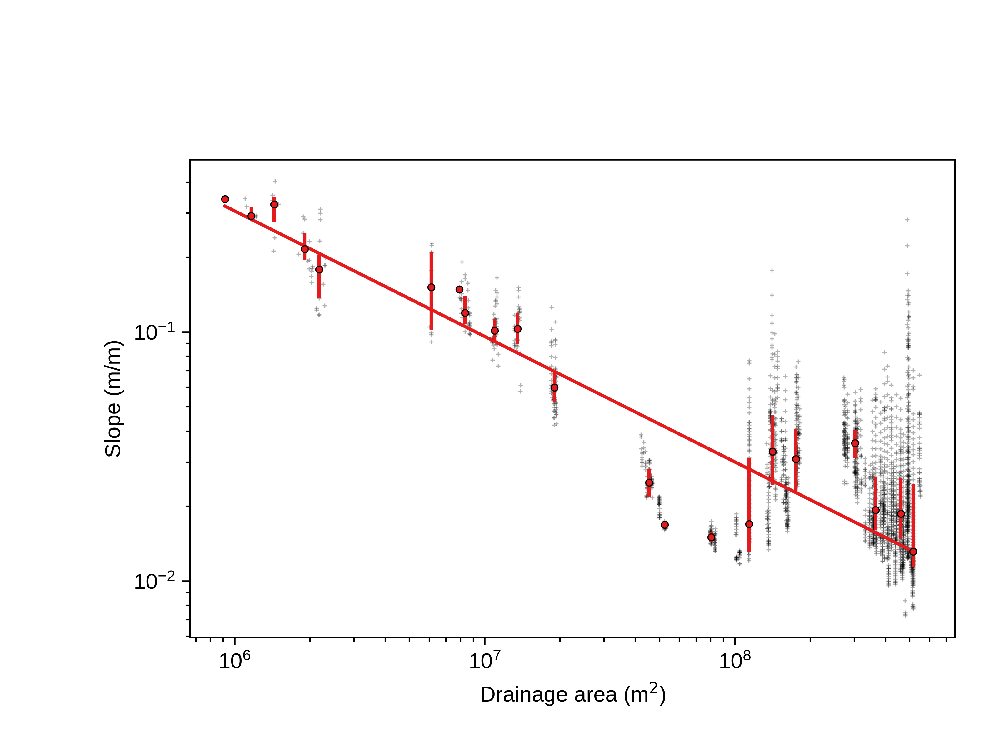

In [21]:
from IPython.display import display, Image
display(Image(filename="./SA_plots/Col_COP30_UTM_SA_plot_raw_and_segmented_basin4.png", width=800))

## Lets look at channels

In [22]:
df = pd.read_csv("Col_COP30_UTM_chi_data_map.csv")
df.head()

,latitude,longitude,chi,elevation,flow_distance,drainage_area,source_key,basin_key
0,10.871981,-73.856619,7.6898,4043.9,68613.0,923400.0,0,0
1,10.872254,-73.856893,7.6457,4043.9,68570.0,981900.0,0,0
2,10.872526,-73.857166,7.6028,4043.9,68528.0,989100.0,0,0
3,10.872798,-73.857440,7.5602,4043.9,68485.0,1000800.0,0,0
4,10.873069,-73.857439,7.5302,4041.9,68455.0,1003500.0,0,0


This gets the chi coordinate from a single basin and plots the channel profile.

<Figure size 625x485.931 with 0 Axes>

<Figure size 640x480 with 0 Axes>

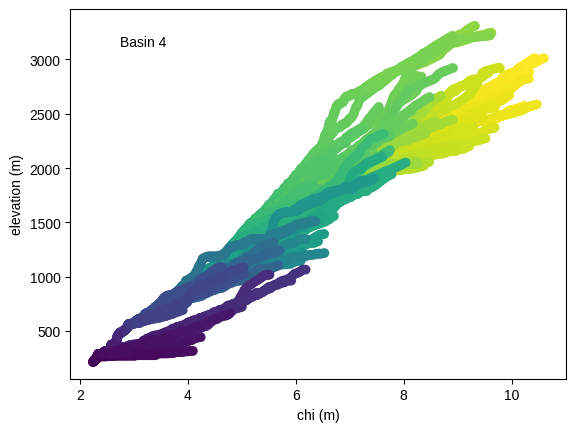

In [23]:
%matplotlib inline
import matplotlib.pyplot as plt
basin = 4
df_single_basin = df[(df['basin_key'] == basin)]

fig = plt.figure()
ax = fig.add_subplot(1, 1,1)

plt.scatter(df_single_basin.chi,df_single_basin.elevation,c=df_single_basin.flow_distance)
plt.xlabel("chi (m)")
plt.ylabel("elevation (m)")
ax.text(0.1,0.9,"Basin "+str(basin),transform=ax.transAxes)
fig.show()

We can also select only the main channel

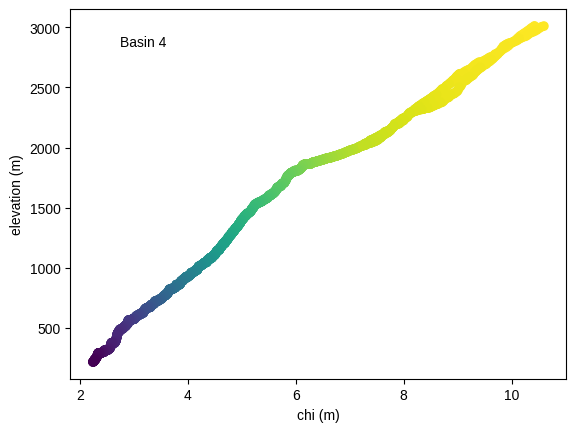

In [27]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
basin = 4
df_single_basin = df[(df['basin_key'] == basin)]
main_stem_source = np.min(df_single_basin.source_key)
df_single_source = df_single_basin[(df_single_basin['source_key'] == main_stem_source)]

fig = plt.figure()
ax = fig.add_subplot(1, 1,1)

plt.scatter(df_single_source.chi,df_single_source.elevation,c=df_single_source.flow_distance)
plt.xlabel("chi (m)")
plt.ylabel("elevation (m)")
ax.text(0.1,0.9,"Basin "+str(basin),transform=ax.transAxes)
fig.show()

It turns out the way the source keys are organised is that they increment along sucessivly long channels. So of the longest channel in a basin is, say, 600, the next longest channel will be 601. So we can use that to plot a few tributaries. I will colour that by source key.

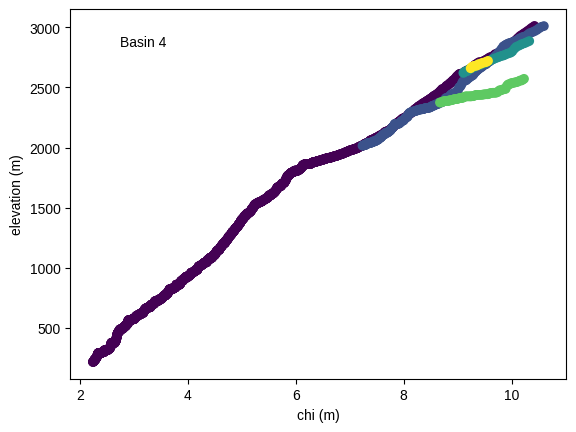

In [29]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
basin = 4
df_single_basin = df[(df['basin_key'] == basin)]
main_stem_source = np.min(df_single_basin.source_key)
df_single_source = df_single_basin[(df_single_basin['source_key'] == main_stem_source)
                                    | (df_single_basin['source_key'] == main_stem_source+1)
                                    | (df_single_basin['source_key'] == main_stem_source+2)
                                    | (df_single_basin['source_key'] == main_stem_source+3)
                                    | (df_single_basin['source_key'] == main_stem_source+4)
                                   ]

fig = plt.figure()
ax = fig.add_subplot(1, 1,1)

plt.scatter(df_single_source.chi,df_single_source.elevation,c=df_single_source.source_key)
plt.xlabel("chi (m)")
plt.ylabel("elevation (m)")
ax.text(0.1,0.9,"Basin "+str(basin),transform=ax.transAxes)
fig.show()

And we can also plot the profiles

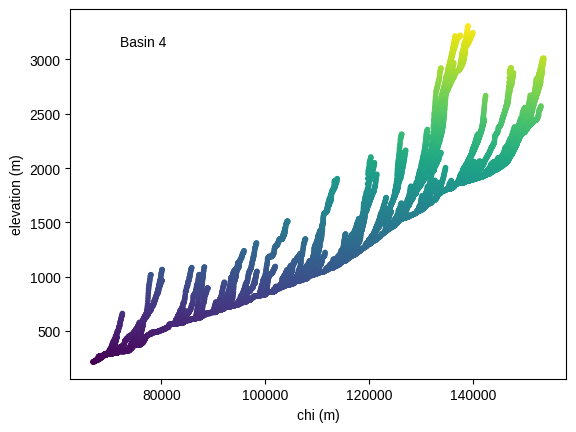

In [32]:
%matplotlib inline
import matplotlib.pyplot as plt
basin = 4
df_single_basin = df[(df['basin_key'] == basin)]

fig = plt.figure()
ax = fig.add_subplot(1, 1,1)

plt.scatter(df_single_basin.flow_distance,df_single_basin.elevation,c=df_single_basin.elevation,s=9)
plt.xlabel("chi (m)")
plt.ylabel("elevation (m)")
ax.text(0.1,0.9,"Basin "+str(basin),transform=ax.transAxes)
fig.show()

Finally, we can plot the gradient in chi-elevation space, using a moving window. This is sometimes called the channel steepness index.

In [45]:
basin = 4
df_single_basin = df[(df['basin_key'] == basin)]
main_stem_source = np.min(df_single_basin.source_key)
df_single_source = df_single_basin[(df_single_basin['source_key'] == main_stem_source)]

z = df_single_source.elevation
x = df_single_source.flow_distance
chi = df_single_source.chi
S = np.gradient(np.asarray(z),np.asarray(x))
S_chi = np.gradient(np.asarray(z),np.asarray(chi))
df_single_source["slope"] = S
df_single_source["chi_slope"] = S_chi
df_single_source['chi_slope_rolling'] = df_single_source.chi_slope.rolling(100,win_type='hamming').mean()

<ipython-input-45-cb4f8d5aaa72>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_single_source["slope"] = S
<ipython-input-45-cb4f8d5aaa72>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_single_source["chi_slope"] = S_chi
<ipython-input-45-cb4f8d5aaa72>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

<Figure size 1000x1000 with 0 Axes>

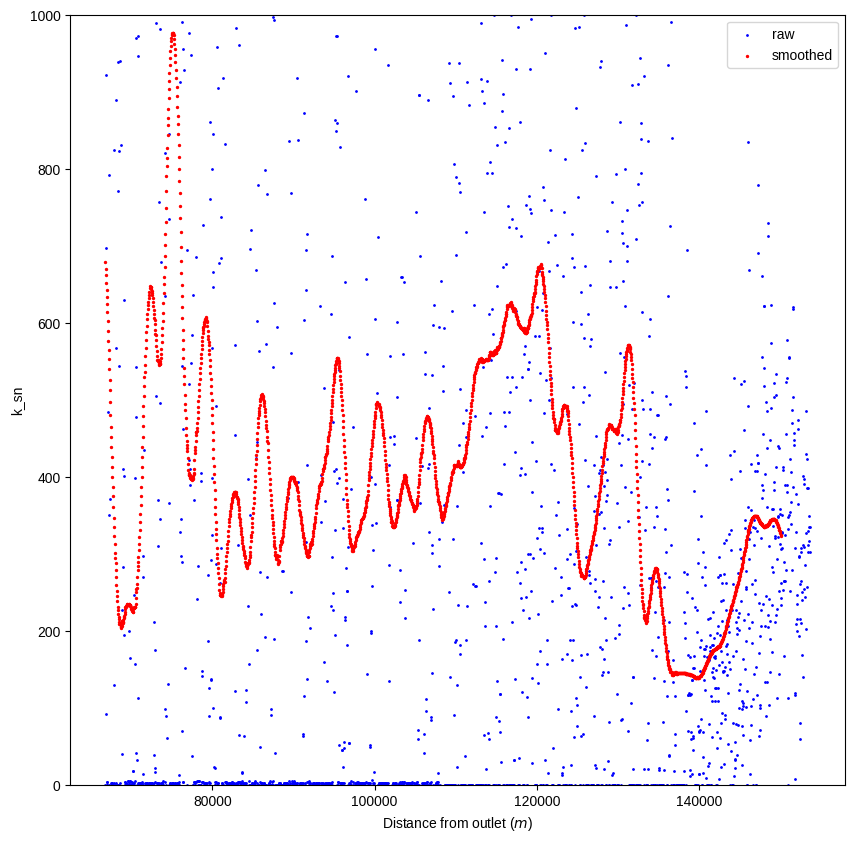

In [52]:
plt.rcParams['figure.figsize'] = [10, 10]

# Now make channel profile plots
# To get a single data column from a pandas dataframe (in this case called gdf_b2) you just put
# a full stop and then the name of the column
# If your column has spaces or funny characters in the name you need to use the square brackets like this:
# z = gdf_b2["elevation"]
# Which is an alternative way of isolating data
z = df_single_source.elevation
x_locs = df_single_source.flow_distance
S = df_single_source.chi_slope
SR = df_single_source.chi_slope_rolling

# Create two subplots and unpack the output array immediately
plt.clf()
f, (ax1) = plt.subplots(1, 1)
ax1.scatter(x_locs, S,s = 1,c="b",label="raw")
ax1.scatter(x_locs, SR, s=2, c= "r",label="smoothed")

ax1.set_xlabel("Distance from outlet ($m$)")
ax1.set_ylabel("k_sn")
plt.ylim((0,1000))
ax1.legend()

